In [1]:
import scanpy as sc
import scanpy.external as sce
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from maren_codes import combat as c
from gprofiler import GProfiler

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:
# ignore R warning messages
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.3+116.g0075c62 anndata==0.6.22.post2.dev80+g72c2bde umap==0.3.9 numpy==1.17.2 scipy==1.3.0 pandas==0.24.1 scikit-learn==0.21.3 statsmodels==0.10.0rc2 python-igraph==0.7.1 louvain==0.6.1


In [3]:
sc.settings.set_figure_params(dpi_save=300, format='svg')

# User input

In [4]:
adata_ko = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_preproc.h5ad'

adata_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_full.h5ad'

adata_mnn_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_mnn_full.h5ad'

adata_mnn_noCC_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_mnn_full_noCC.h5ad'

expression_mat_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_expr_scran.csv'

expression_mat_metadata_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_expr_scran_meta.csv'

count_mat_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_counts.csv'

count_mat_metadata_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_counts_meta.csv'

cellxgene_out = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/processed_data/neuronal_diff_cell_lines_ko_cellxgene.h5ad'

folder = '/storage/groups/ml01/workspace/malte.luecken/2019_wurst_demuxlet/Main_study/'

cc_genes_tirosh = '/home/icb/malte.luecken/single-cell-tutorial/Tirosh_cell_cycle_genes_human.txt'
cc_genes_file = '/home/icb/malte.luecken/single-cell-tutorial/Macosko_cell_cycle_genes.txt'

# Read data

In [5]:
adata = sc.read(adata_ko, cache=True)

In [6]:
adata

AnnData object with n_obs × n_vars = 3671 × 20623 
    obs: 'Demux_state', 'Donor', 'Lane', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors', 'S_score', 'G2M_score', 'phase'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'Lane_colors', 'neighbors', 'pca', 'phase_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [4]:
adata_noCC_mnn = sc.read(adata_mnn_noCC_out)

In [5]:
adata_noCC_mnn

AnnData object with n_obs × n_vars = 3671 × 17026 
    obs: 'Demux_state', 'Donor', 'G2M_score', 'Lane', 'S_score', 'donor', 'log_counts', 'louvain_r0.2', 'louvain_r0.3', 'louvain_r0.5', 'louvain_r1', 'mt_frac', 'n_counts', 'n_genes', 'phase', 'size_factors', 'louvain_r0.2_noCC', 'louvain_r0.3_noCC', 'louvain_final'
    var: 'n_cells', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'louvain', 'louvain_final_colors', 'louvain_r0.2_colors', 'louvain_r0.2_noCC_colors', 'louvain_r0.3_colors', 'louvain_r0.3_noCC_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_r0.2_noCC', 'rank_genes_r0.2_noCC_corr', 'rank_genes_r0.3_noCC', 'rank_genes_r0.3_noCC_corr'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

# Some plots

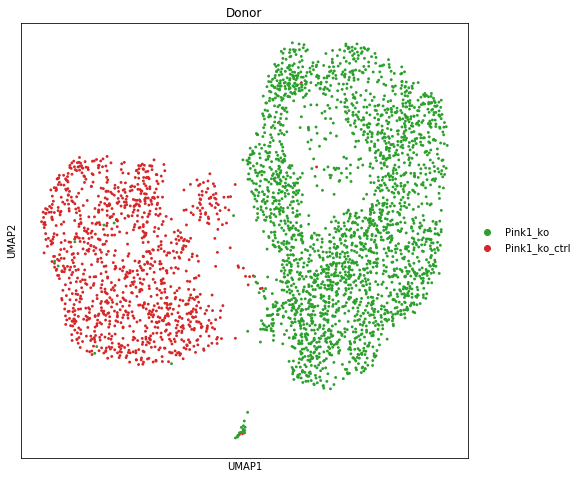

In [7]:
sc.pl.umap(adata, color='Donor')

Note:
- this data needs to be integrated before being analysed.

# Regress out CC then MNN correction

## Regress out CC

In [102]:
adata_noCC_mnn = adata.copy()

In [103]:
adata_noCC_mnn

AnnData object with n_obs × n_vars = 3671 × 17026 
    obs: 'Demux_state', 'Donor', 'Lane', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_r1', 'louvain_r0.5', 'louvain_r0.3', 'louvain_r0.2'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'Lane_colors', 'neighbors', 'pca', 'phase_colors', 'louvain', 'louvain_r1_colors', 'louvain_r0.5_colors', 'louvain_r0.3_colors', 'louvain_r0.2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [104]:
sc.pp.regress_out(adata_noCC_mnn, ['S_score', 'G2M_score'])

regressing out ['S_score', 'G2M_score']
    finished (0:01:27)


## MNN Data integration

In [105]:
datasets = [adata_noCC_mnn[adata_noCC_mnn.obs['Donor'] == d,:].copy() for d in adata_noCC_mnn.obs['Donor'].cat.categories]

In [106]:
len(datasets)

2

In [107]:
datasets[0]
datasets[1]

AnnData object with n_obs × n_vars = 2529 × 17026 
    obs: 'Demux_state', 'Donor', 'Lane', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_r1', 'louvain_r0.5', 'louvain_r0.3', 'louvain_r0.2'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'Lane_colors', 'neighbors', 'pca', 'phase_colors', 'louvain', 'louvain_r1_colors', 'louvain_r0.5_colors', 'louvain_r0.3_colors', 'louvain_r0.2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

AnnData object with n_obs × n_vars = 1142 × 17026 
    obs: 'Demux_state', 'Donor', 'Lane', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'size_factors', 'S_score', 'G2M_score', 'phase', 'louvain_r1', 'louvain_r0.5', 'louvain_r0.3', 'louvain_r0.2'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Donor_colors', 'Lane_colors', 'neighbors', 'pca', 'phase_colors', 'louvain', 'louvain_r1_colors', 'louvain_r0.5_colors', 'louvain_r0.3_colors', 'louvain_r0.2_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

Using the bigger dataset as integration reference. Even if this is the knockout case.

In [108]:
for d in datasets:
    sc.pp.highly_variable_genes(d, n_top_genes=6000, flavor='cell_ranger', inplace=True)
    
hvgs = [set(d.var_names[d.var['highly_variable']]) for d in datasets]

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [109]:
[len(i) for i in hvgs]

[5999, 6000]

In [110]:
hvg_intersect = hvgs[0].intersection(*hvgs[1:12])

In [111]:
len(hvg_intersect)

5328

In [113]:
adata_noCC_mnn = sce.pp.mnn_correct(*datasets, var_subset=list(hvg_intersect), batch_key="donor")

Performing cosine normalization...
Starting MNN correct iteration. Reference batch: 0
Step 1 of 1: processing batch 1
  Looking for MNNs...
  Computing correction vectors...
  Adjusting variance...
  Applying correction...
MNN correction complete. Gathering output...
Packing AnnData object...
Done.


## HVGs & Dimensionality reduction MNN

In [114]:
mnn_pairing = adata_noCC_mnn[1]
adata_noCC_mnn = adata_noCC_mnn[0]

In [115]:
# Check highly variable gene selection to look at the results
sc.pp.highly_variable_genes(adata_noCC_mnn, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 3225


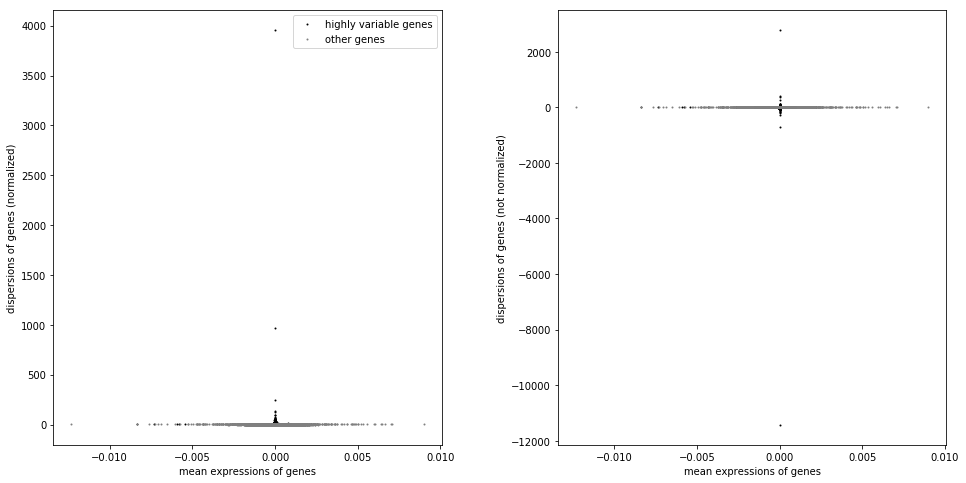

In [116]:
#Plot the highly variable genes
sc.pl.highly_variable_genes(adata_noCC_mnn)

In [117]:
adata_noCC_mnn.var.columns

Index(['n_cells', 'highly_variable-0', 'means-0', 'dispersions-0',
       'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1',
       'dispersions_norm-1', 'highly_variable', 'means', 'dispersions',
       'dispersions_norm'],
      dtype='object')

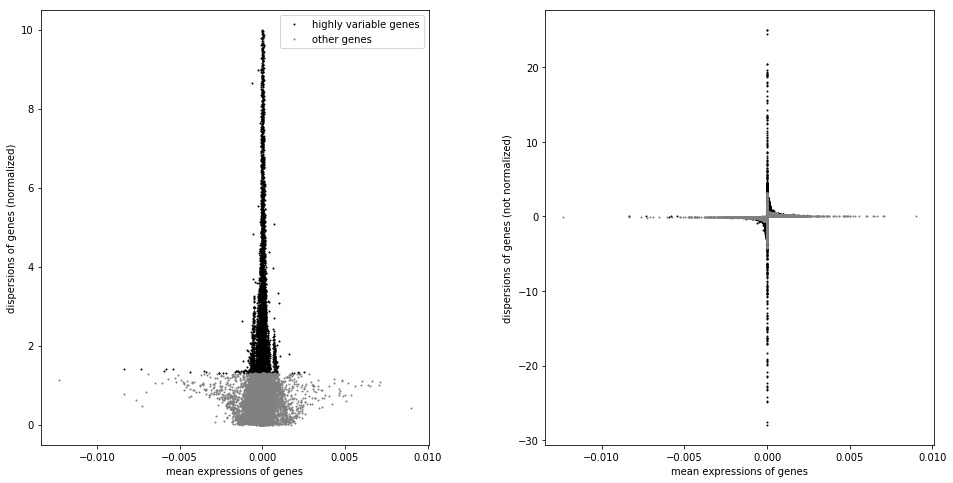

In [118]:
test = adata_noCC_mnn[:,np.flatnonzero(adata_noCC_mnn.var["dispersions_norm"] < 10)].copy()
sc.pl.highly_variable_genes(test)


In [119]:
sc.pp.pca(adata_noCC_mnn, n_comps=50, svd_solver='arpack')
sc.pp.neighbors(adata_noCC_mnn)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)


# Visualization

In [120]:
# Calculate the visualizations
sc.tl.umap(adata_noCC_mnn)

computing UMAP
    finished (0:00:08)


... storing 'Donor' as categorical
... storing 'Lane' as categorical
... storing 'louvain_r0.3' as categorical
... storing 'louvain_r0.5' as categorical
... storing 'louvain_r1' as categorical


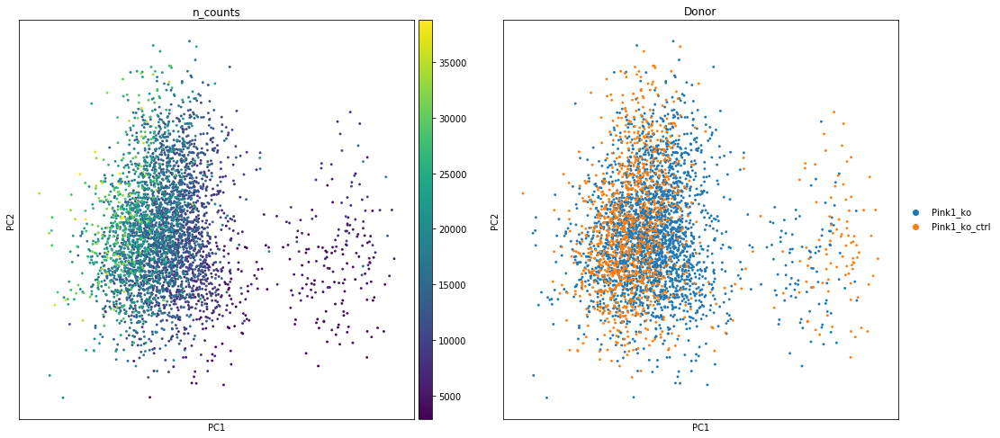

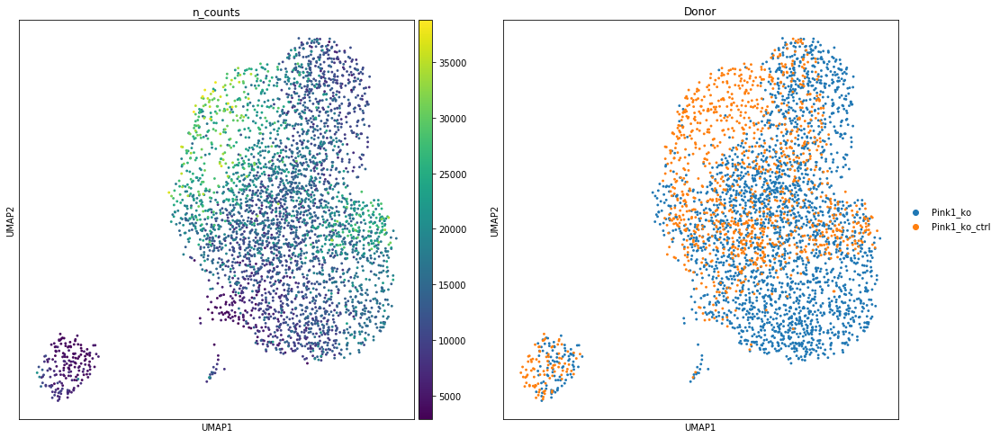

In [121]:
sc.pl.pca_scatter(adata_noCC_mnn, color=['n_counts', 'Donor'], use_raw=False)
sc.pl.umap(adata_noCC_mnn, color=['n_counts', 'Donor'], use_raw=False)


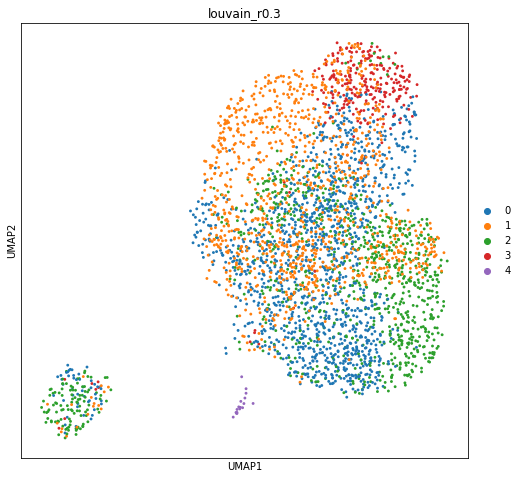

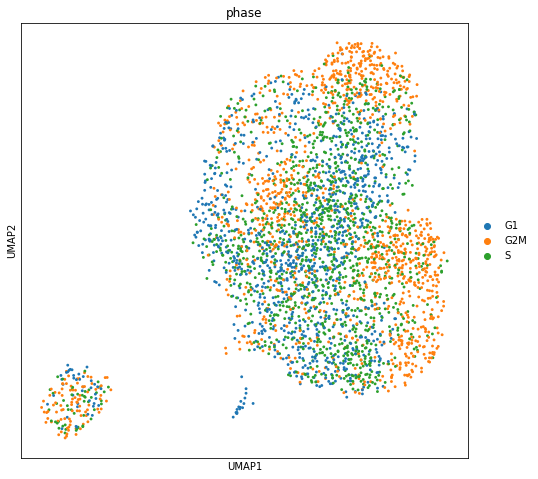

In [124]:
sc.pl.umap(adata_noCC_mnn, color='louvain_r0.3')
sc.pl.umap(adata_noCC_mnn, color='phase')

This looks much better!

# Reclustering

In [125]:
sc.tl.louvain(adata_noCC_mnn, resolution=0.2, key_added='louvain_r0.2_noCC')
sc.tl.louvain(adata_noCC_mnn, resolution=0.3, key_added='louvain_r0.3_noCC')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00)


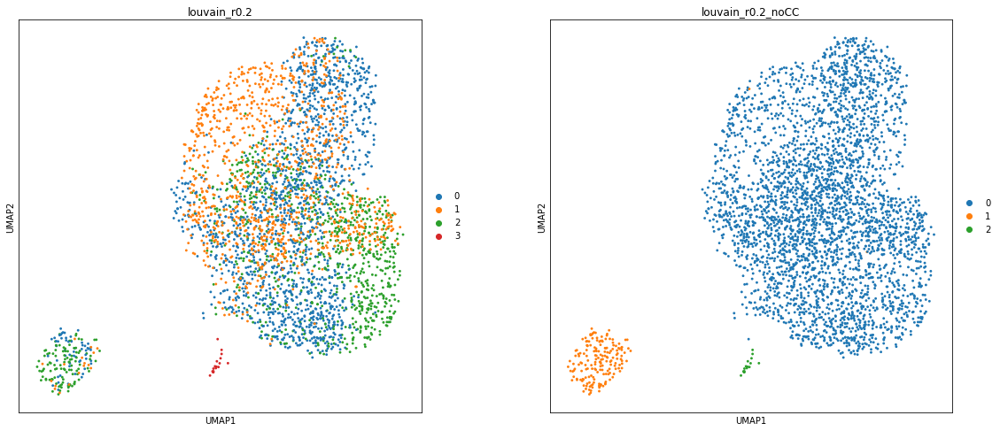

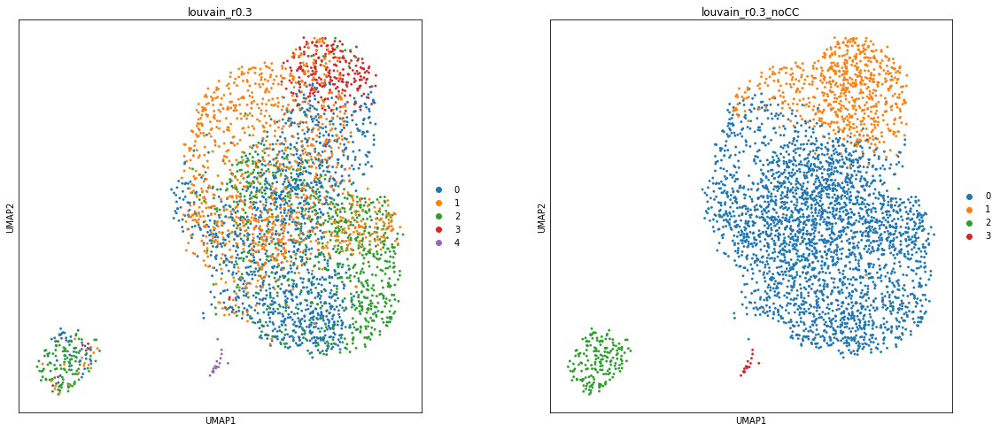

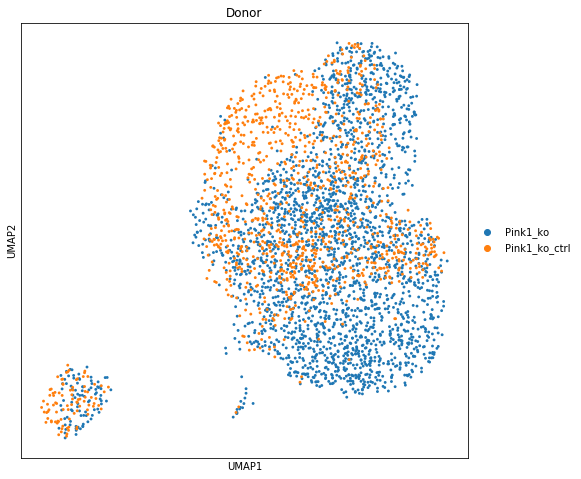

In [127]:
sc.pl.umap(adata_noCC_mnn, color=['louvain_r0.2', 'louvain_r0.2_noCC'], wspace=0.2)
sc.pl.umap(adata_noCC_mnn, color=['louvain_r0.3', 'louvain_r0.3_noCC'], wspace=0.2)
sc.pl.umap(adata_noCC_mnn, color="Donor")

Looks like we should start with resolution 0.3.

In [153]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata_noCC_mnn, groupby='louvain_r0.3_noCC', key_added='rank_genes_r0.3_noCC')
sc.tl.rank_genes_groups(adata_noCC_mnn, groupby='louvain_r0.2_noCC', key_added='rank_genes_r0.2_noCC')

ranking genes
    finished (0:00:01)
ranking genes
    finished (0:00:01)


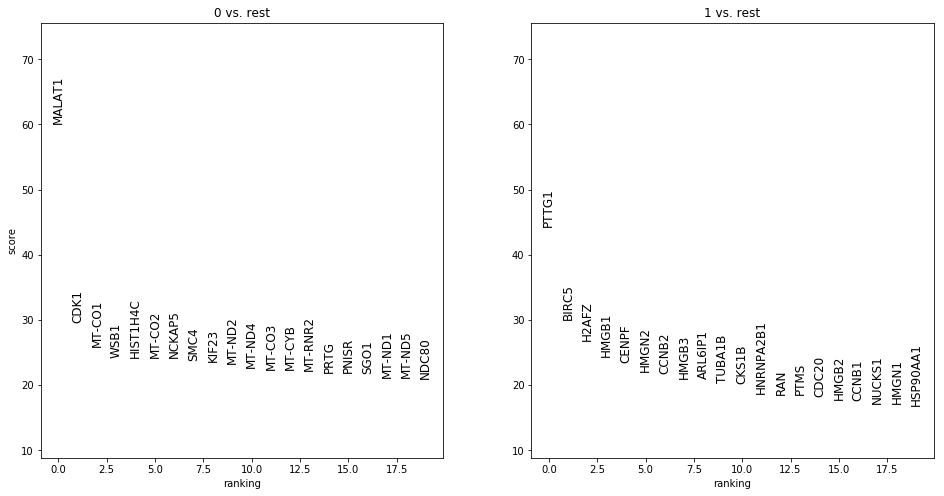

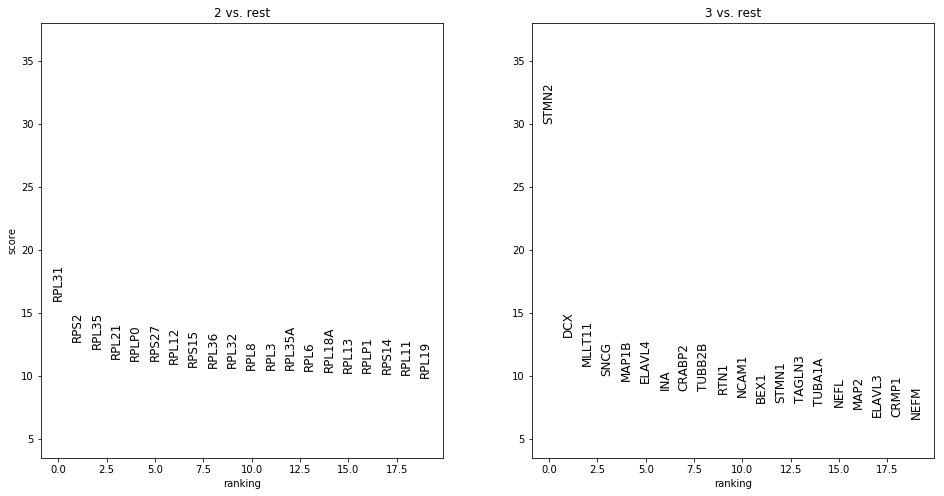

In [129]:
#Plot the new marker genes - r0.3
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.3_noCC', groups=['0','1'], fontsize=12)
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.3_noCC', groups=['2','3'], fontsize=12)

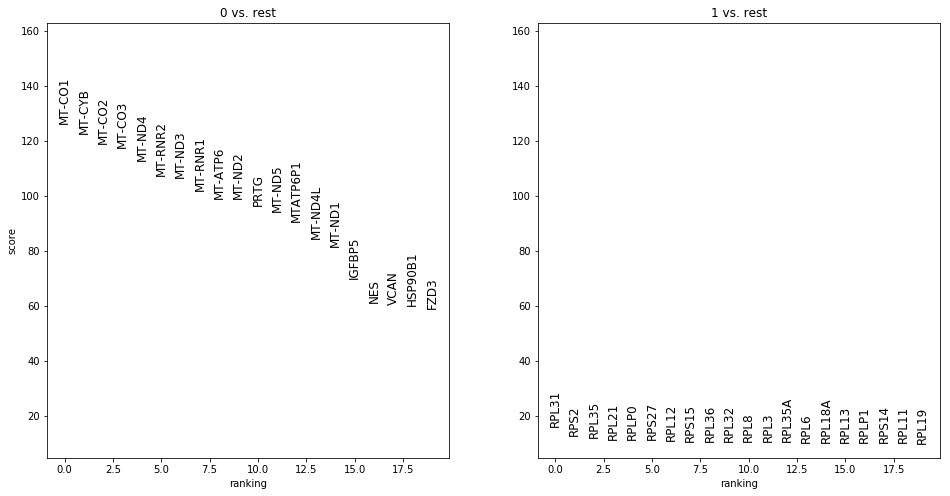

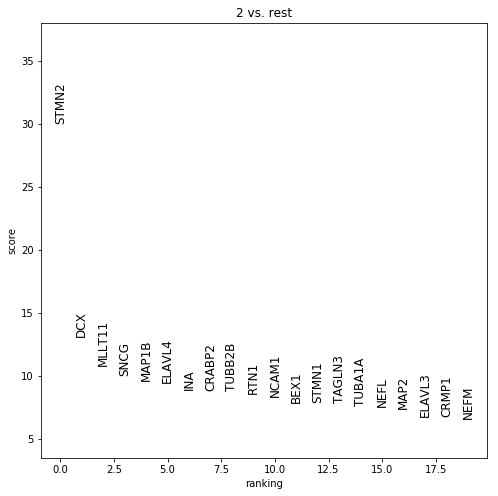

In [154]:
#Plot the new marker genes - r0.2
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.2_noCC', groups=['0','1'], fontsize=12)
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.2_noCC', groups=['2'], fontsize=12)

### Marker genes on corrected data (no CC, MNN integrated)

Use wilcoxon here as distribution assumptions are unlikely to be met in corrected data.

In [155]:
#Get the new marker genes
sc.tl.rank_genes_groups(adata_noCC_mnn, groupby='louvain_r0.3_noCC', key_added='rank_genes_r0.3_noCC_corr', use_raw=False, method='wilcoxon')
sc.tl.rank_genes_groups(adata_noCC_mnn, groupby='louvain_r0.2_noCC', key_added='rank_genes_r0.2_noCC_corr', use_raw=False, method='wilcoxon')

ranking genes
    finished (0:00:08)
ranking genes
    finished (0:00:07)


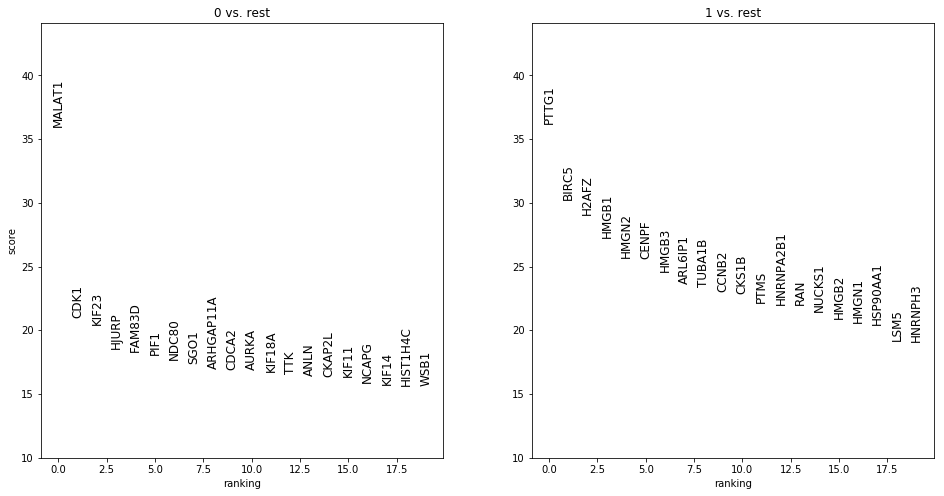

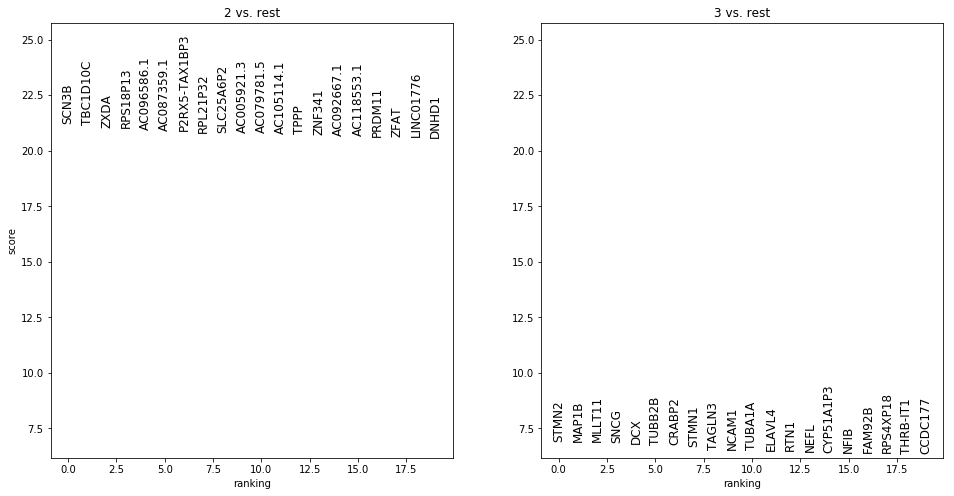

In [131]:
#Plot the new marker genes - r0.3
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.3_noCC_corr', groups=['0','1'], fontsize=12)
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.3_noCC_corr', groups=['2','3'], fontsize=12)

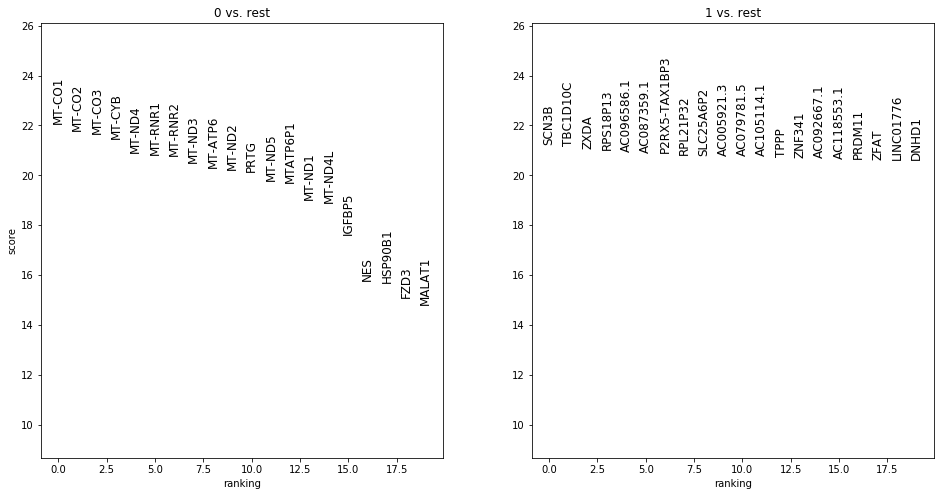

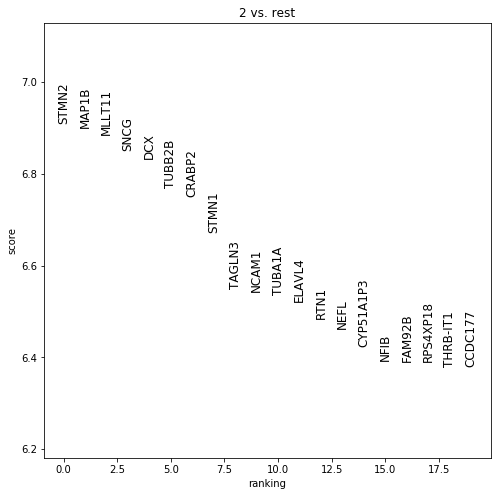

In [156]:
#Plot the new marker genes - r0.2
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.2_noCC_corr', groups=['0','1'], fontsize=12)
sc.pl.rank_genes_groups(adata_noCC_mnn, key='rank_genes_r0.2_noCC_corr', groups=['2'], fontsize=12)

### Output marker genes

In [135]:
pd.DataFrame(adata_noCC_mnn.uns['rank_genes_r0.3_noCC']['names']).to_csv(folder+'intermediate_data/Neuronal_diff_cell_lines_ko_marker_genes_louvain_r0.3_noCC.csv')

In [136]:
pd.DataFrame(adata_noCC_mnn.uns['rank_genes_r0.3_noCC_corr']['names']).to_csv(folder+'intermediate_data/Neuronal_diff_cell_lines_ko_marker_genes_louvain_r0.3_noCC_corr.csv')

In [157]:
pd.DataFrame(adata_noCC_mnn.uns['rank_genes_r0.2_noCC']['names']).to_csv(folder+'intermediate_data/Neuronal_diff_cell_lines_ko_marker_genes_louvain_r0.2_noCC.csv')

In [158]:
pd.DataFrame(adata_noCC_mnn.uns['rank_genes_r0.2_noCC_corr']['names']).to_csv(folder+'intermediate_data/Neuronal_diff_cell_lines_ko_marker_genes_louvain_r0.2_noCC_corr.csv')

## Some plots

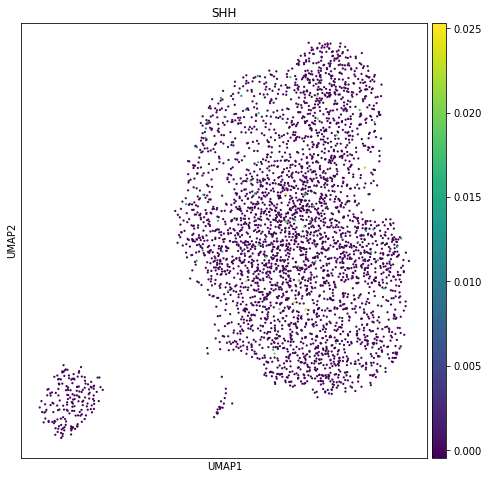

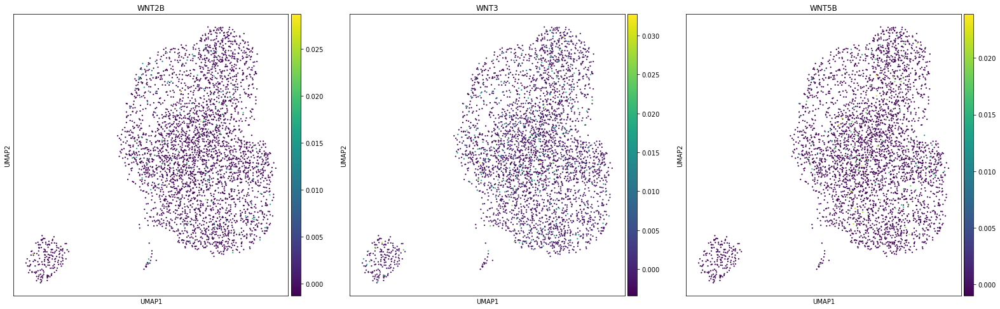

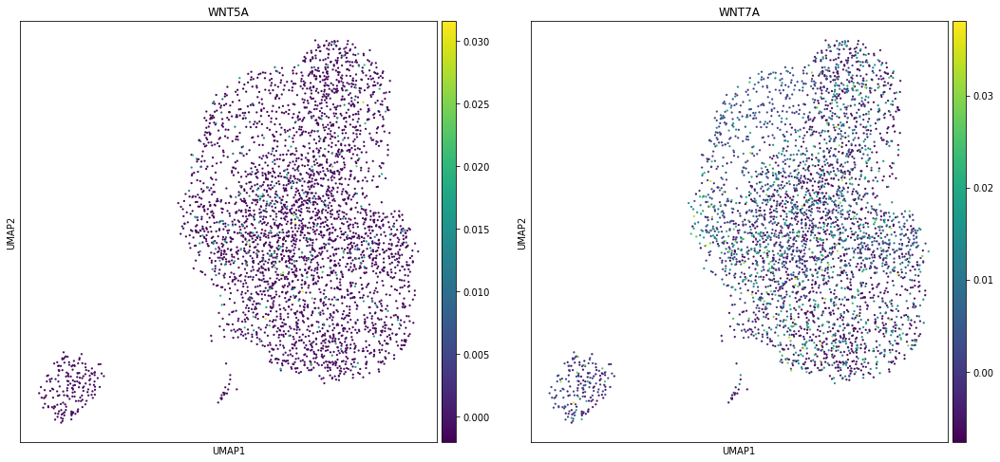

In [137]:
sc.pl.umap(adata_noCC_mnn, color='SHH', use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['WNT2B','WNT3', 'WNT5B'], use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['WNT5A','WNT7A'], use_raw=False, size=20)

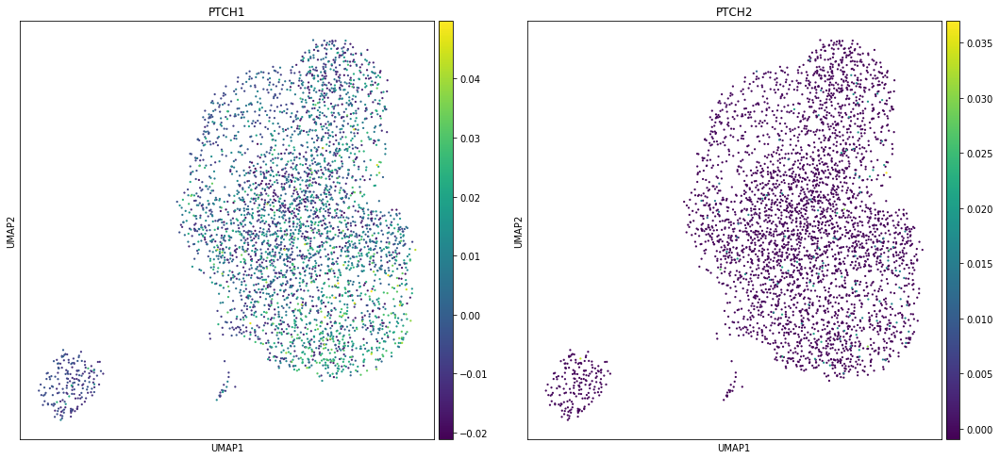

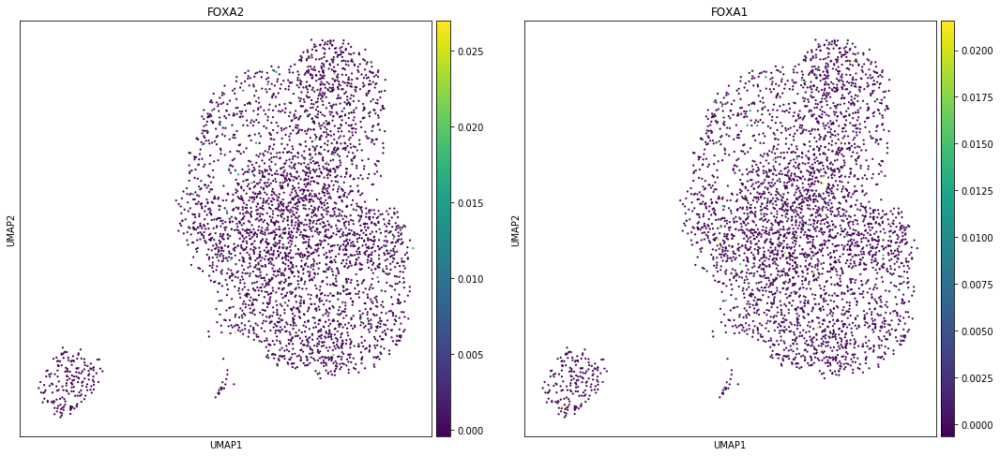

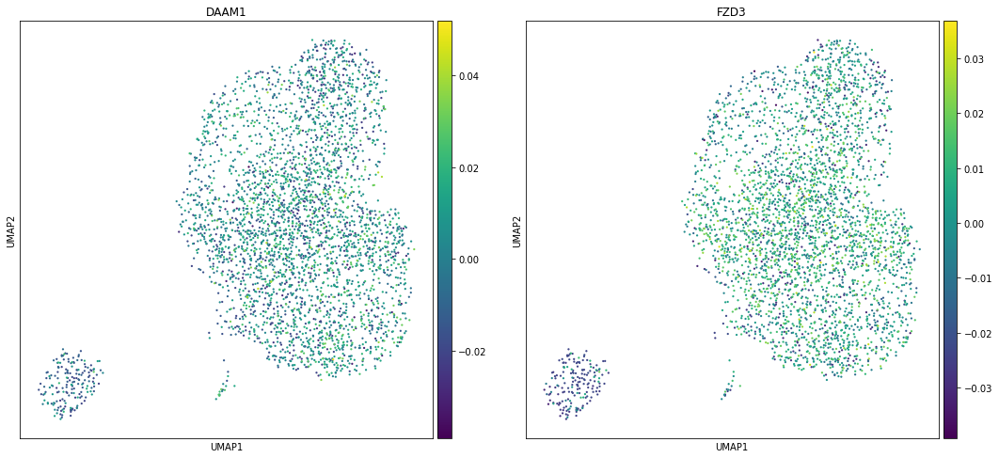

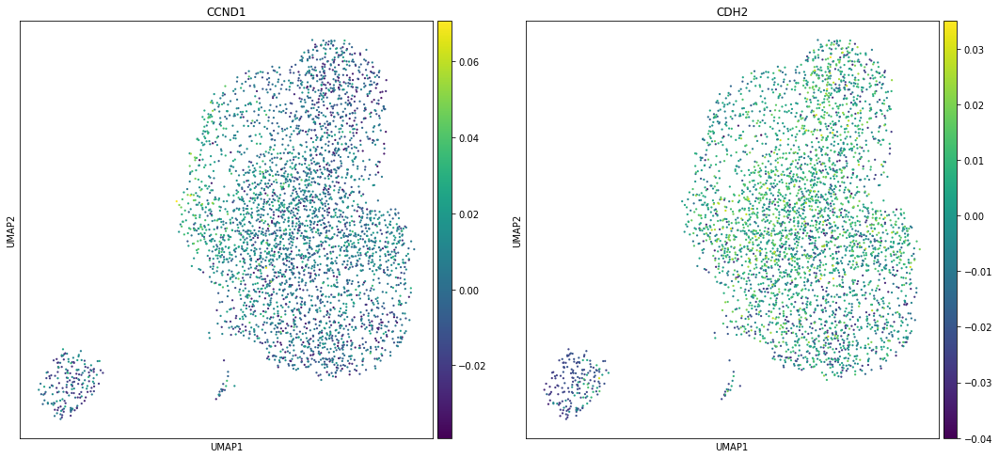

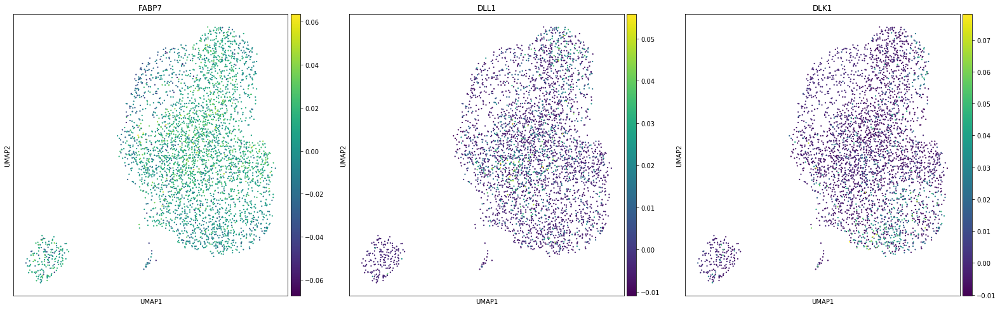

In [138]:
sc.pl.umap(adata_noCC_mnn, color=['PTCH1','PTCH2'], use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['FOXA2','FOXA1'], use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['DAAM1','FZD3'], use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['CCND1','CDH2'], use_raw=False, size=20)
sc.pl.umap(adata_noCC_mnn, color=['FABP7','DLL1', 'DLK1'], use_raw=False, size=20)

## Highly expressed genes per cluster

### noCC


Cluster 0:
normalizing by total count per cell
filtered out 2663 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


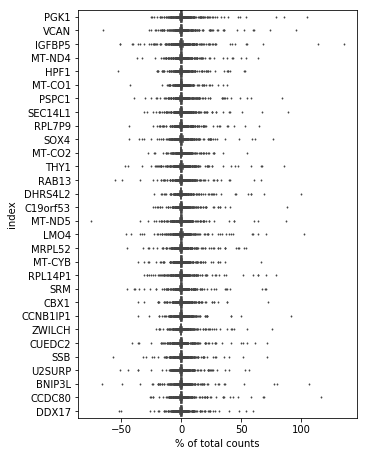

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


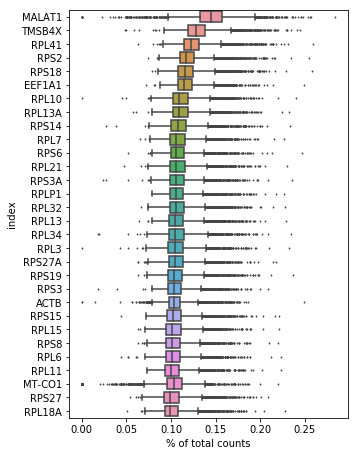

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


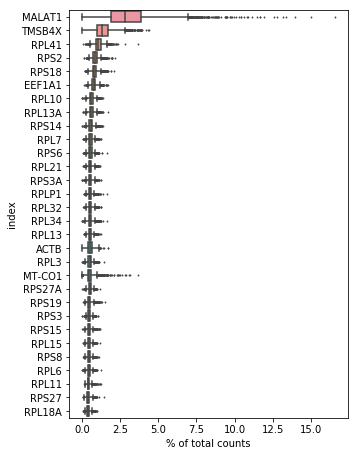


Cluster 1:
normalizing by total count per cell
filtered out 20 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


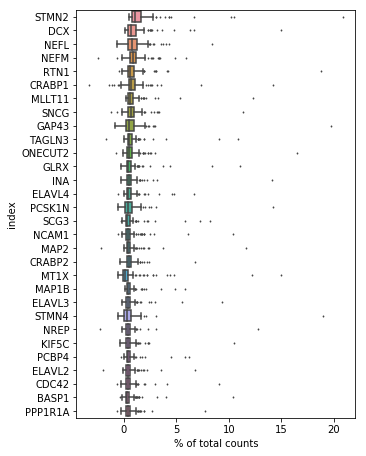

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


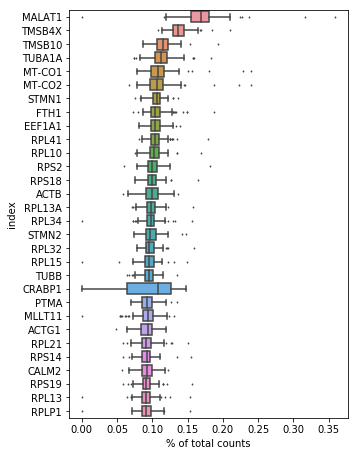

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


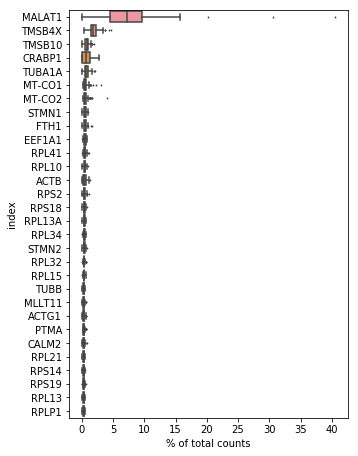


Cluster 2:
normalizing by total count per cell
filtered out 20 cells that haveless than 1 counts
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


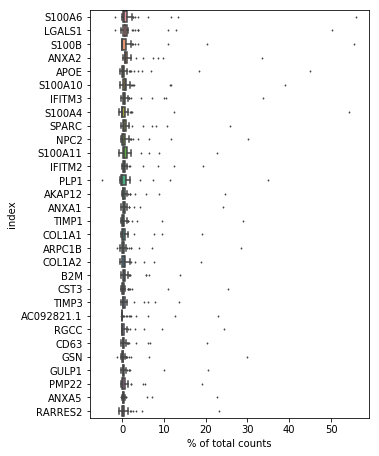

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


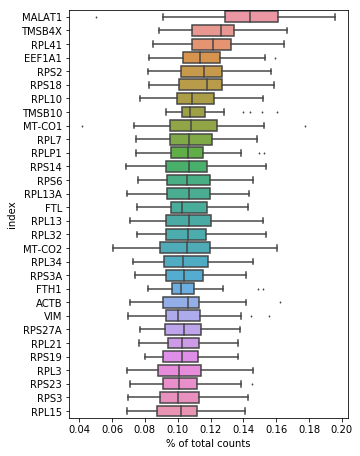

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


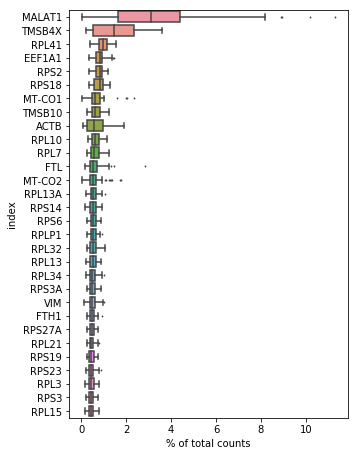

In [138]:
for clust in adata_noCC_mnn.obs['louvain_r0.15_noCC_mnn'].cat.categories:
    print("")
    print(f'Cluster {clust}:')
    tmp = adata_noCC_mnn[[c == clust for c in adata_noCC_mnn.obs['louvain_r0.15_noCC_mnn']]].copy()
    sc.pl.highest_expr_genes(tmp, n_top=30)
    
    tmp.X = tmp.raw[:,tmp.var_names].X
    sc.pl.highest_expr_genes(tmp, n_top=30)

    tmp.X = tmp.layers['counts']
    sc.pl.highest_expr_genes(tmp, n_top=30)    

# Rename annotations

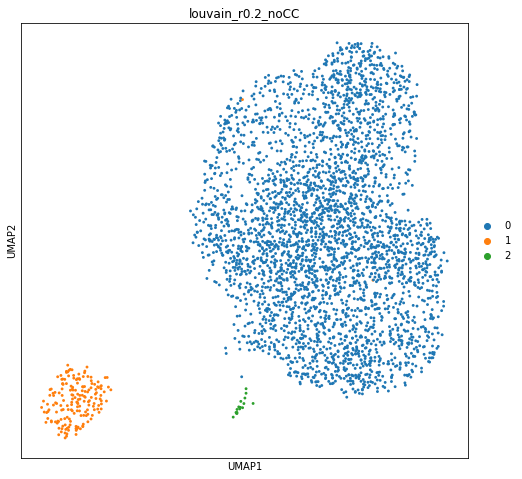

In [163]:
sc.pl.umap(adata_noCC_mnn, color='louvain_r0.2_noCC')

In [161]:
adata_noCC_mnn.obs['louvain_final'] = adata_noCC_mnn.obs['louvain_r0.2_noCC']

In [164]:
adata_noCC_mnn.rename_categories('louvain_final', ['NSCs', 'Apoptotic NSCs', 'Immature neurons'])

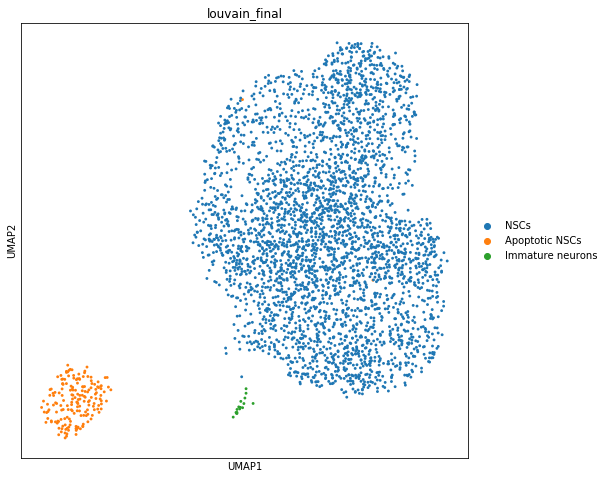

In [165]:
sc.pl.umap(adata_noCC_mnn, color='louvain_final')

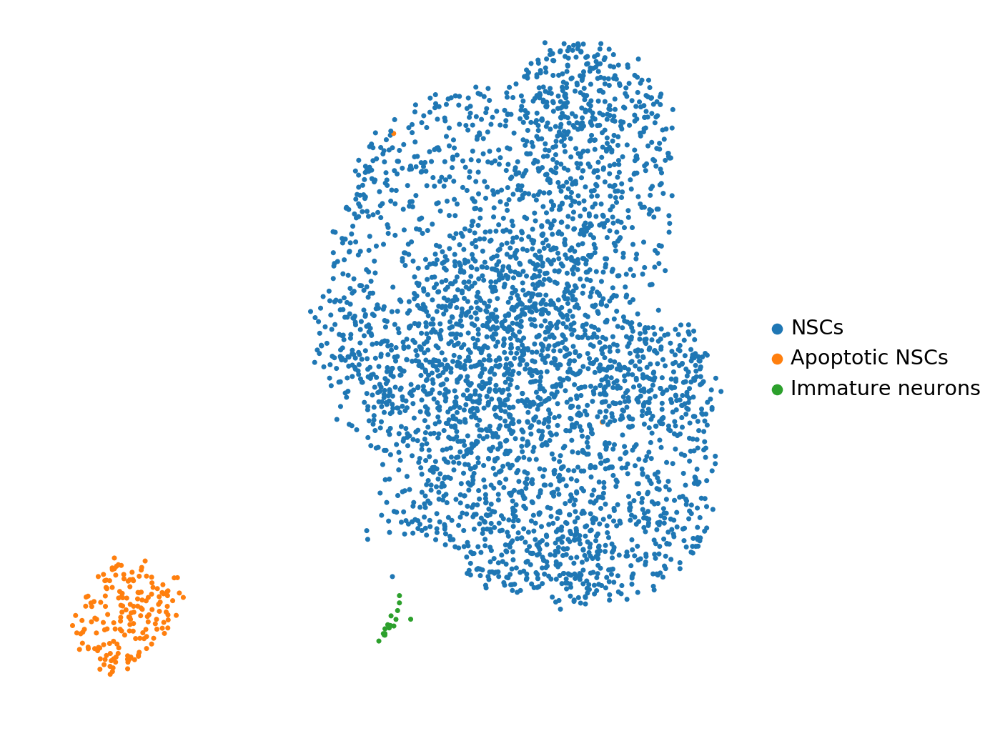

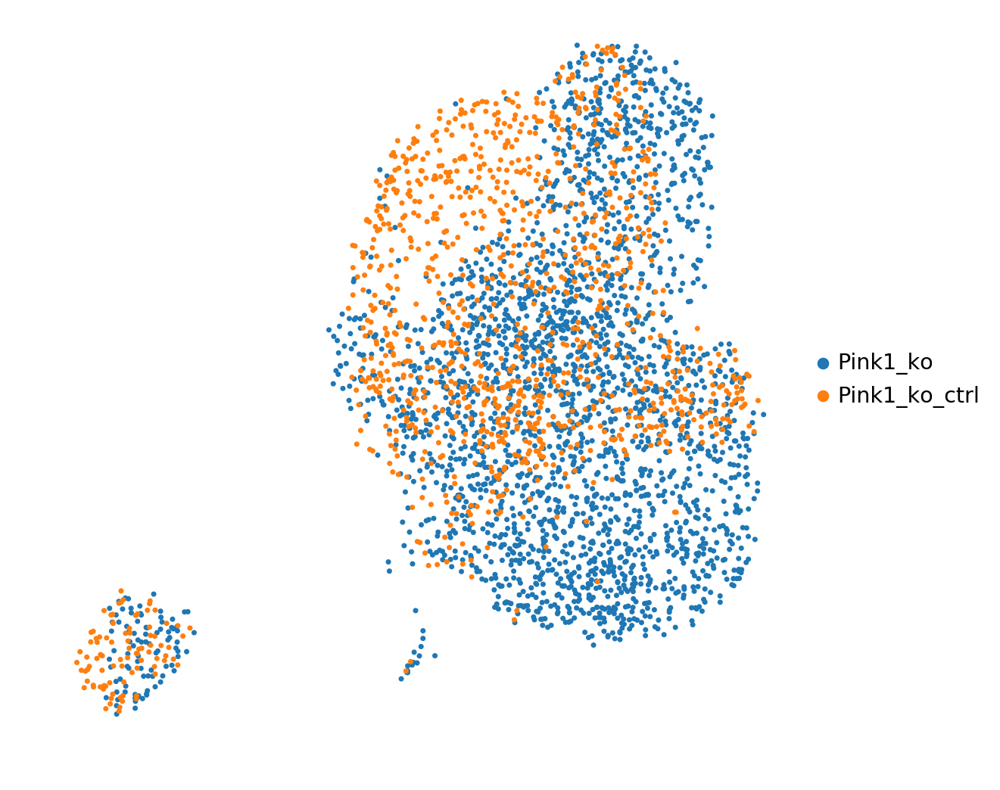

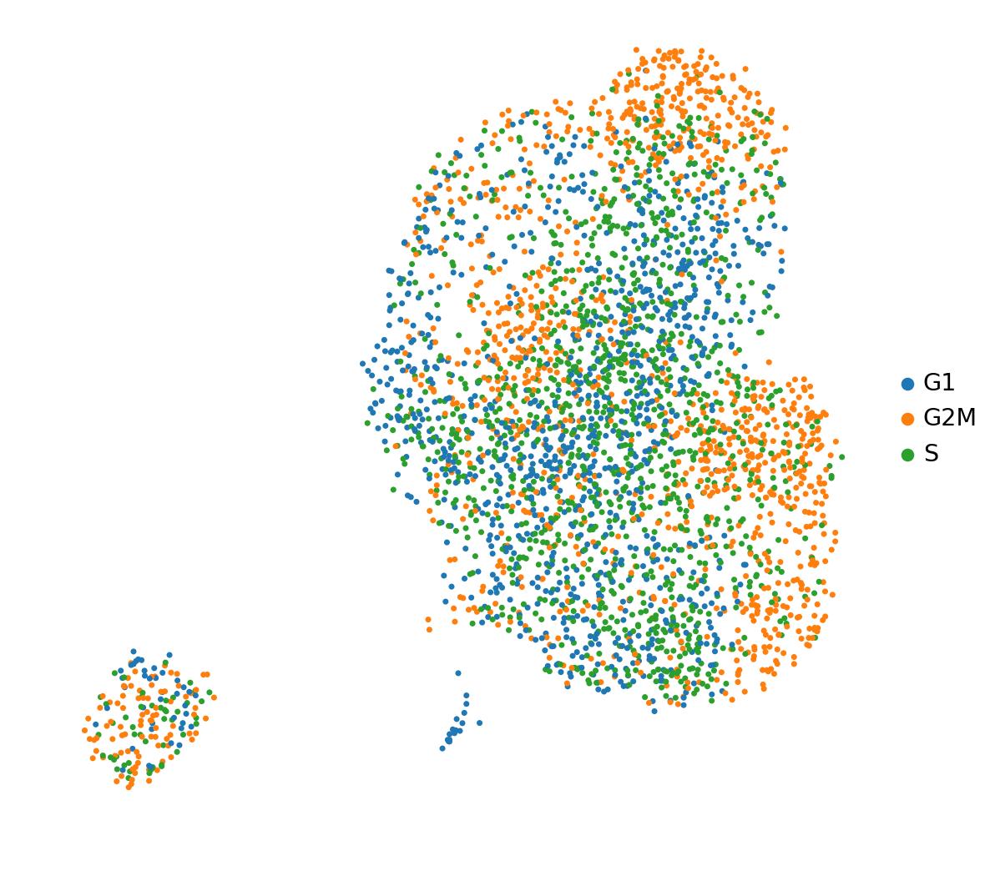

In [10]:
rcParams['figure.figsize']= (8,8)
sc.pl.umap(adata_noCC_mnn, color='louvain_final', size=40, frameon=False, title="", save='_cell_lines_ko_noCC_mnn_louvain_final.svg')
sc.pl.umap(adata_noCC_mnn, color='Donor', size=40, frameon=False, title="", save='_cell_lines_ko_noCC_mnn_donor.svg')
sc.pl.umap(adata_noCC_mnn, color='phase', size=40, frameon=False, title="", save='_cell_lines_ko_noCC_mnn_phase.svg')


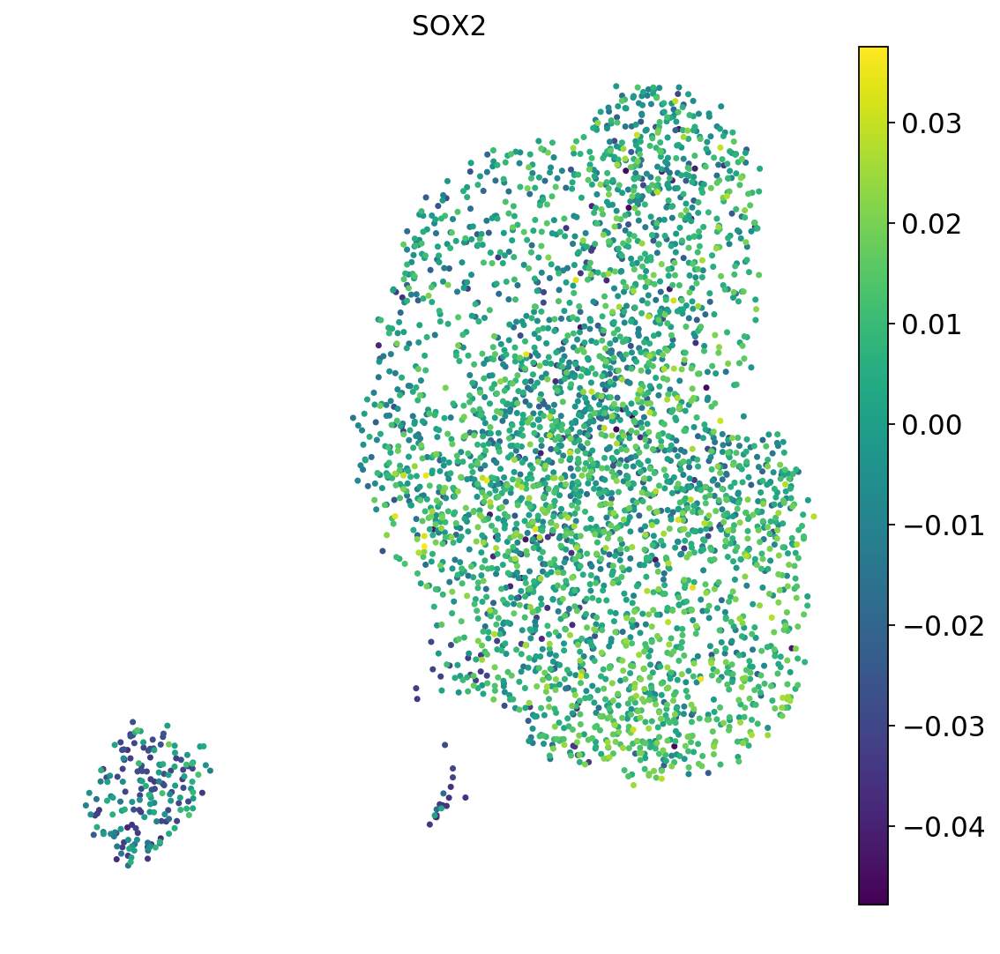

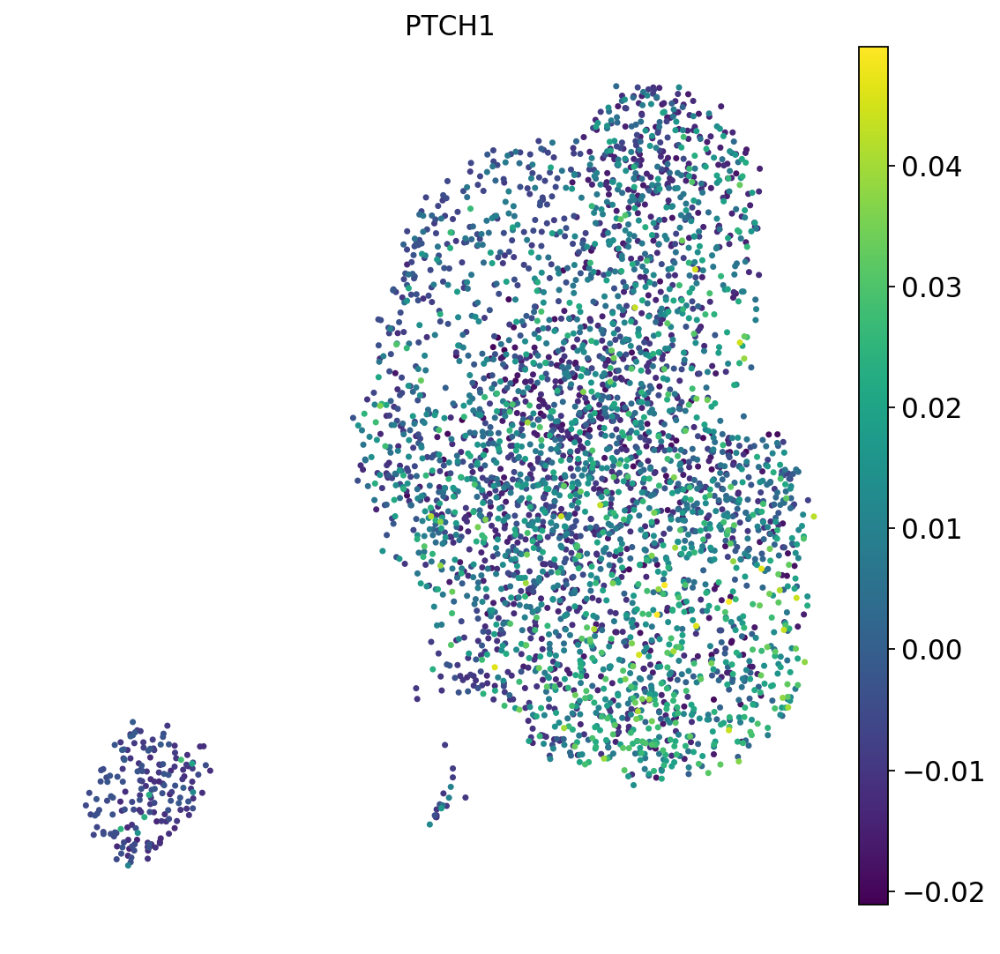

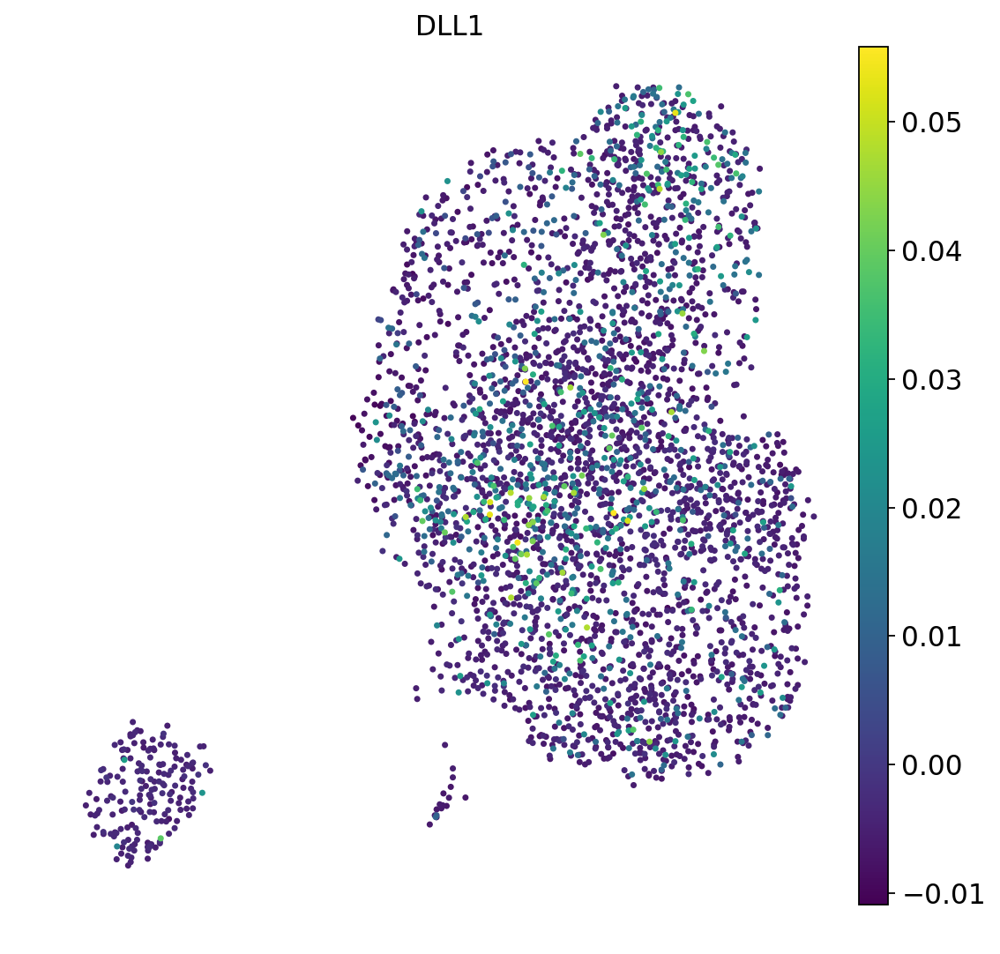

In [11]:
sc.pl.umap(adata_noCC_mnn, color='SOX2', size=40, use_raw=False, frameon=False, save='_cell_lines_ko_noCC_mnn_sox2.svg')
sc.pl.umap(adata_noCC_mnn, color='PTCH1', size=40, use_raw=False, frameon=False, save='_cell_lines_ko_noCC_mnn_ptch1.svg')
sc.pl.umap(adata_noCC_mnn, color='DLL1', size=40, use_raw=False, frameon=False, save='_cell_lines_ko_noCC_mnn_dll1.svg')

# Transfer some annotations

In [140]:
adata.obs['louvain_r0.2_noCC'] = adata_noCC_mnn.obs['louvain_r0.2_noCC']
adata.obs['louvain_r0.3_noCC'] = adata_noCC_mnn.obs['louvain_r0.3_noCC']
adata_mnn.obs['louvain_r0.2_noCC'] = adata_noCC_mnn.obs['louvain_r0.2_noCC']
adata_mnn.obs['louvain_r0.3_noCC'] = adata_noCC_mnn.obs['louvain_r0.3_noCC']

Note: consider re-saving `adata` above after transfer of annotations.


# Output noCC data

In [166]:
adata_noCC_mnn

AnnData object with n_obs × n_vars = 3671 × 17026 
    obs: 'Demux_state', 'Donor', 'G2M_score', 'Lane', 'S_score', 'donor', 'log_counts', 'louvain_r0.2', 'louvain_r0.3', 'louvain_r0.5', 'louvain_r1', 'mt_frac', 'n_counts', 'n_genes', 'phase', 'size_factors', 'louvain_r0.2_noCC', 'louvain_r0.3_noCC', 'louvain_final'
    var: 'n_cells', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'Donor_colors', 'louvain_r0.3_colors', 'phase_colors', 'louvain', 'louvain_r0.2_colors', 'louvain_r0.2_noCC_colors', 'louvain_r0.3_noCC_colors', 'rank_genes_r0.3_noCC', 'rank_genes_r0.3_noCC_corr', 'rank_genes_r0.2_noCC', 'rank_genes_r0.2_noCC_corr', 'louvain_final_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [167]:
adata_noCC_mnn.write(adata_mnn_noCC_out)

# Output cellxgene object

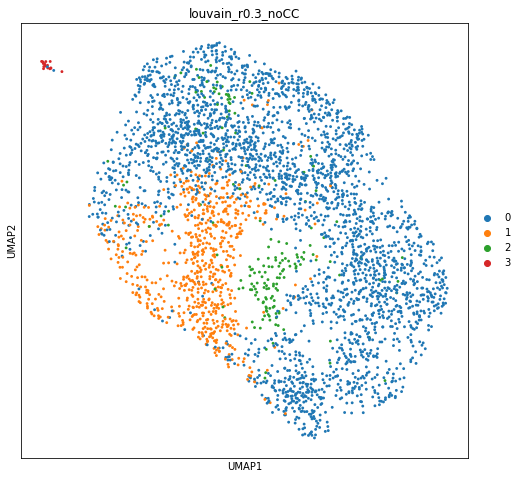

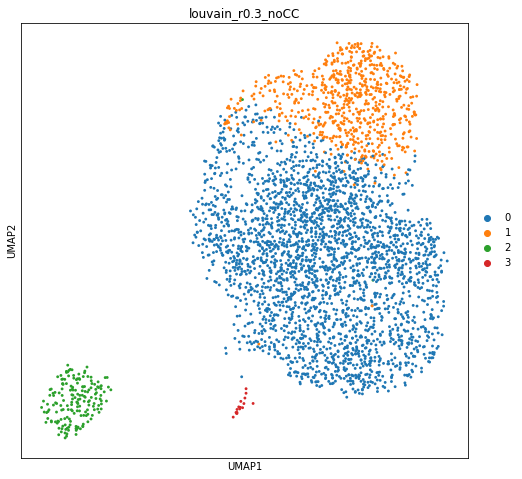

In [147]:
sc.pl.umap(adata_mnn, color='louvain_r0.3_noCC')
sc.pl.umap(adata_noCC_mnn, color='louvain_r0.3_noCC')

Note:
- use adata_noCC_mnn as cellxgene output. This represents the structure in the data much better.

In [168]:
cellxgene = adata_noCC_mnn.copy()

In [169]:
cellxgene

AnnData object with n_obs × n_vars = 3671 × 17026 
    obs: 'Demux_state', 'Donor', 'G2M_score', 'Lane', 'S_score', 'donor', 'log_counts', 'louvain_r0.2', 'louvain_r0.3', 'louvain_r0.5', 'louvain_r1', 'mt_frac', 'n_counts', 'n_genes', 'phase', 'size_factors', 'louvain_r0.2_noCC', 'louvain_r0.3_noCC', 'louvain_final'
    var: 'n_cells', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'Donor_colors', 'louvain_r0.3_colors', 'phase_colors', 'louvain', 'louvain_r0.2_colors', 'louvain_r0.2_noCC_colors', 'louvain_r0.3_noCC_colors', 'rank_genes_r0.3_noCC', 'rank_genes_r0.3_noCC_corr', 'rank_genes_r0.2_noCC', 'rank_genes_r0.2_noCC_corr', 'louvain_final_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [170]:
cellxgene._varm = None
cellxgene.raw = None

In [171]:
cellxgene.write(cellxgene_out)

# Output expression data

In [180]:
adata_noCC_mnn

AnnData object with n_obs × n_vars = 3671 × 17026 
    obs: 'Demux_state', 'Donor', 'G2M_score', 'Lane', 'S_score', 'donor', 'log_counts', 'louvain_r0.2', 'louvain_r0.3', 'louvain_r0.5', 'louvain_r1', 'mt_frac', 'n_counts', 'n_genes', 'phase', 'size_factors', 'louvain_r0.2_noCC', 'louvain_r0.3_noCC', 'louvain_final'
    var: 'n_cells', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'neighbors', 'Donor_colors', 'louvain_r0.3_colors', 'phase_colors', 'louvain', 'louvain_r0.2_colors', 'louvain_r0.2_noCC_colors', 'louvain_r0.3_noCC_colors', 'rank_genes_r0.3_noCC', 'rank_genes_r0.3_noCC_corr', 'rank_genes_r0.2_noCC', 'rank_genes_r0.2_noCC_corr', 'louvain_final_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [179]:
adata_noCC_mnn.raw = adata

In [182]:
pd.DataFrame(adata_noCC_mnn.raw.X, index=adata_noCC_mnn.obs_names, columns=adata_noCC_mnn.raw.var_names).to_csv(expression_mat_out)

In [185]:
adata_noCC_mnn.obs['condition'] = adata_noCC_mnn.obs['Donor']

In [186]:
adata_noCC_mnn.obs[['condition', 'louvain_final']].to_csv(expression_mat_metadata_out)

# Output count matrix

In [ ]:
pd.DataFrame(adata_noCC_mnn.layers['counts'], index=adata_noCC_mnn.obs_names, columns=adata_noCC_mnn.raw.var_names).to_csv(count_mat_out)

In [ ]:
adata_noCC_mnn.obs[['condition', 'louvain_final']].to_csv(count_mat_metadata_out)

# Additional plots

In [5]:
adata_noCC_mnn = sc.read(adata_mnn_noCC_out)

## Stacked barplot

In [14]:
adata_noCC_mnn.obs['Donor'].cat.categories
adata_noCC_mnn.obs['louvain_final'].cat.categories

Index(['PINK1 KO', 'Isogenic Ctrl'], dtype='object')

Index(['NSCs', 'Apoptotic NSCs', 'Immature neurons'], dtype='object')

In [12]:
adata_noCC_mnn.rename_categories('Donor', ['PINK1 KO', 'Isogenic Ctrl'])

In [15]:
adata_noCC_mnn.rename_categories('louvain_final', ['NSC1', 'Apoptotic NSCs', 'Immature neurons'])

Text(0.5, 0, 'Sample')

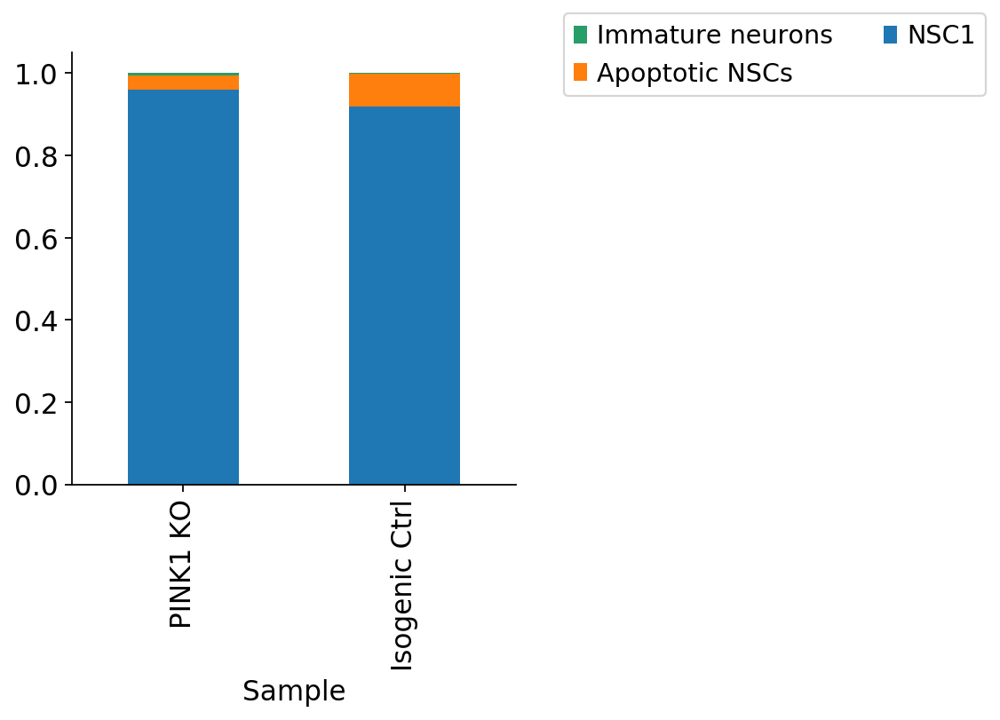

In [16]:
ax = pd.crosstab(adata_noCC_mnn.obs['Donor'], adata_noCC_mnn.obs['louvain_final'], normalize=0).plot(kind='bar', stacked=True, legend=False)#, color=ct_colors)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], bbox_to_anchor=(1.08,1.12,0,0), ncol=2)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.grid(False)
plt.xlabel('Sample')
plt.savefig('../figures/Ko_cell_line_sample_celltype_composition.pdf', bbox_inches='tight')

plt.show()

In [17]:
pd.crosstab(adata_noCC_mnn.obs['louvain_final'], adata_noCC_mnn.obs['Donor'])

Donor,PINK1 KO,Isogenic Ctrl
louvain_final,,
NSC1,2425,1050
Apoptotic NSCs,90,90
Immature neurons,14,2


## Marker genes

In [18]:
genes = ['FOXA2', 'SHH', 'DCX', 'MAP2']

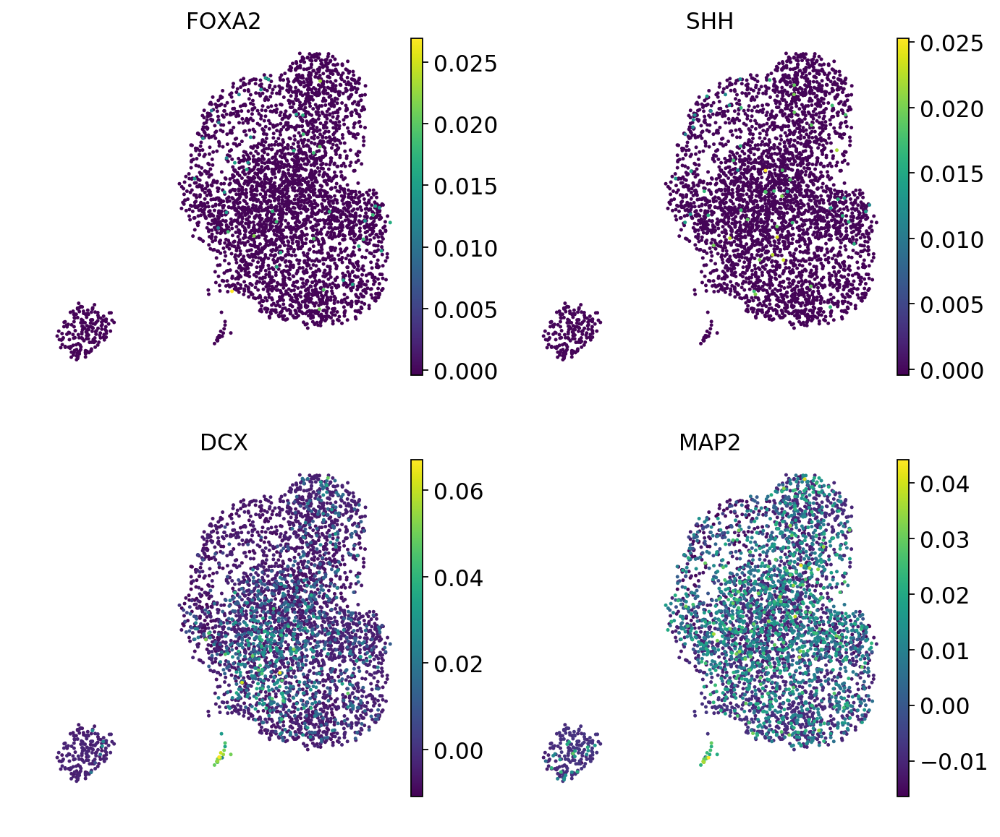

In [22]:
sc.pl.umap(adata_noCC_mnn, size=20, color=genes, ncols=2, title=genes+[''], frameon=False, use_raw=False, save='_figure_marker_gene_plots_ko_cell_line.svg')